In [395]:
import numpy as np
import pandas as pd
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import scipy.stats as stats


* importing dataset

In [396]:
df = pd.read_csv('banking.csv')

In [397]:
df.shape

(41188, 21)

🌟 Preprocess ⇛
_____________________

In [398]:
df.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp_var_rate      0
cons_price_idx    0
cons_conf_idx     0
euribor3m         0
nr_employed       0
y                 0
dtype: int64

_______________________________________________
 Handling missing values and Outliers
 ___________________________________________

In [399]:
(df.loc[df['default'] == 'unknown'].shape[0]/df.shape[0])*100

20.87258424783918

In [400]:
df['default'].value_counts()

no         32588
unknown     8597
yes            3
Name: default, dtype: int64

In [401]:
df['y'].value_counts()

0    36548
1     4640
Name: y, dtype: int64

_____________________________________________________________________________________

🔹 'default' looks biased column ( 20% unknown, only 3 yes ),So droping 'default' 👊

🔹 Drop 'duration' because metioned in dataset document 👊
_____________________________________________________________________________________


In [402]:
df.drop(['duration'],axis=1,inplace=True)
df.drop(['default'],axis=1,inplace=True)

-------------------------------------------------------------------
🔹 drop all unknown values rows in categorical variable values 👊
_______________________________________________________________________

In [403]:
df.drop(df[ 
     (df['job']=='unknown')|
     (df['marital']=='unknown')|
     (df['education']=='unknown')|
     (df['housing']=='unknown')|
     (df['loan']=='unknown')].index,inplace=True)

-----------------------------
* change to categorical codes 🏄
* feature coding
-------------------------------- 

In [404]:
df['job'] = df['job'].astype('category').cat.codes
df['marital'] = df['marital'].astype('category').cat.codes
df['education'] = df['education'].astype('category').cat.codes
df['housing'] = df['housing'].astype('category').cat.codes
df['loan'] = df['loan'].astype('category').cat.codes
df['contact'] = df['contact'].astype('category').cat.codes
df['month'] = df['month'].astype('category').cat.codes
df['day_of_week'] = df['day_of_week'].astype('category').cat.codes
df['poutcome'] = df['poutcome'].astype('category').cat.codes
df['y'] = df['y'].astype('category').cat.codes

 🔹Visulaizing features with boxplot 📊.

/home/inshaf/.local/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='cons_conf_idx'>

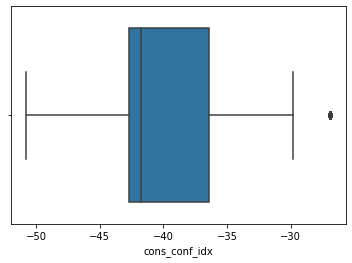

In [405]:
sns.boxplot(df.cons_conf_idx)

_____________________________________________
🔹 'cons_conf_idx' contain  outliear

🔹 Handling 'cons_conf_idx'  outliear
________________________________________________

In [406]:
max_val = df.cons_conf_idx.quantile(0.95)
min_val = df.cons_conf_idx.quantile(0.05)
df = df[(df['cons_conf_idx']>min_val) & (df['cons_conf_idx']<max_val)]

________________________________________________
🔹 Separate catergorical , numerical columns
🔹 Categorical dataframe => df2
🔹 Numerical dataframe   => df 
__________________________________________________

/home/inshaf/.local/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='cons_conf_idx'>

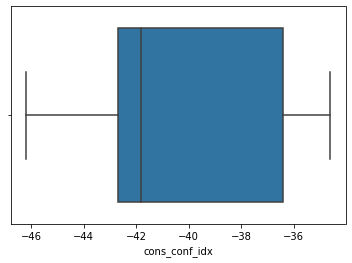

In [407]:
sns.boxplot(df.cons_conf_idx)

In [408]:
df2 = pd.DataFrame([
    df['job'],
    df['marital'],
    df['education'],
    df['housing'],
    df['loan'],
    df['contact'],
    df['month'],
    df['day_of_week'],
    df['poutcome'],
    df['y'],
    ]).transpose()

In [409]:
df.drop(['job','marital','education','housing','loan','contact','month','day_of_week','poutcome','y'], axis = 1 , inplace=True)

array([[<AxesSubplot:title={'center':'age'}>,
        <AxesSubplot:title={'center':'campaign'}>,
        <AxesSubplot:title={'center':'pdays'}>],
       [<AxesSubplot:title={'center':'previous'}>,
        <AxesSubplot:title={'center':'emp_var_rate'}>,
        <AxesSubplot:title={'center':'cons_price_idx'}>],
       [<AxesSubplot:title={'center':'cons_conf_idx'}>,
        <AxesSubplot:title={'center':'euribor3m'}>,
        <AxesSubplot:title={'center':'nr_employed'}>]], dtype=object)

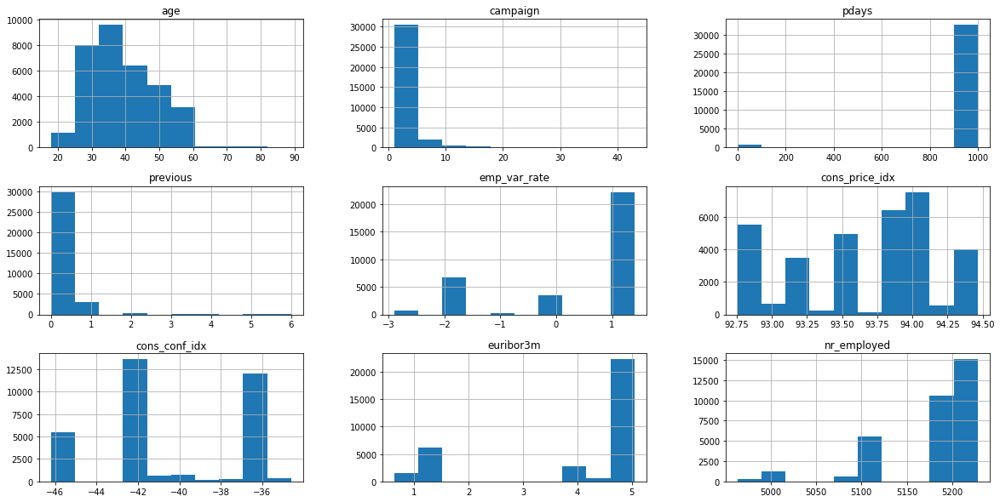

In [410]:
df.hist(alpha=1,figsize=(20, 10))

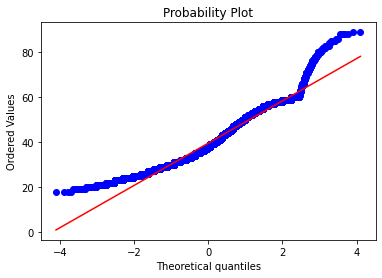

In [411]:
stats.probplot(df["age"], dist="norm", plot=plt)
plt.show()

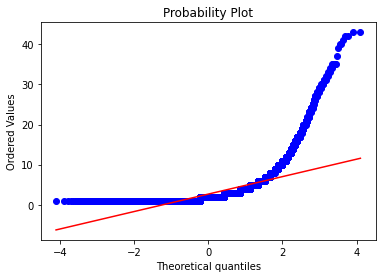

In [412]:
stats.probplot(df["campaign"], dist="norm", plot=plt)
plt.show()

after transformation

<AxesSubplot:>

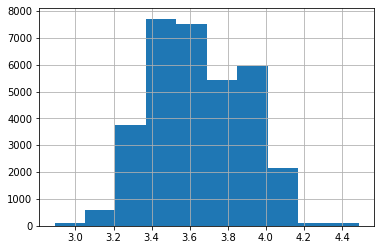

In [413]:
from sklearn.preprocessing import FunctionTransformer
log_transformer = FunctionTransformer(np.log,validate=True)
df['age'] = log_transformer.transform(df[['age']])
df['age'].hist()

<AxesSubplot:>

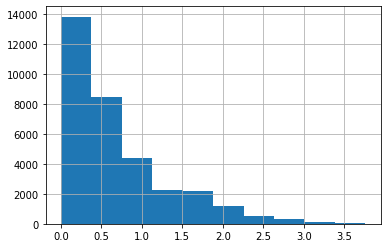

In [414]:
log_transformer = FunctionTransformer(np.log,validate=True)
df['campaign'] = log_transformer.transform(df[['campaign']])
df['campaign'].hist()

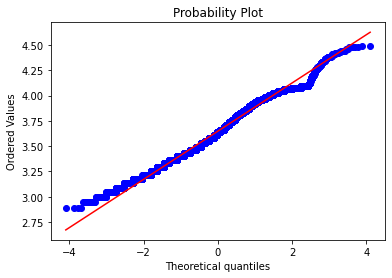

In [415]:
stats.probplot(df["age"], dist="norm", plot=plt)
plt.show()

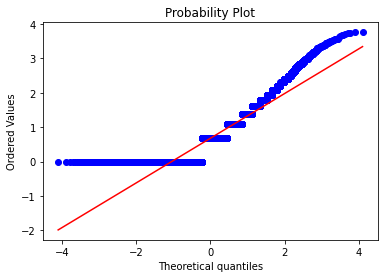

In [416]:
stats.probplot(df["campaign"], dist="norm", plot=plt)
plt.show()

🔹 standerize values

In [417]:
cols =[
'age',
'campaign',
'pdays',
'previous',
'emp_var_rate',
'cons_price_idx',
'cons_conf_idx',
'euribor3m',
'nr_employed'
 ]
scaler = StandardScaler() 
scaler.fit(df)
df = scaler.transform(df)
df = pd.DataFrame(df, columns=cols)
df.head()

,age,campaign,pdays,previous,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,nr_employed
0,0.564447,-0.958968,0.154099,-0.304384,0.727725,-0.444616,1.201570,0.633878,0.731946
1,-1.322178,0.597241,-6.491662,4.391890,-1.595490,0.762361,0.198550,-2.098803,-3.010441
2,-1.034196,1.986607,0.154099,-0.304384,0.727725,0.491730,-0.587601,0.632587,0.731946
3,-0.158804,-0.958968,0.154099,-0.304384,-1.670433,-1.533068,-1.536403,-1.712846,-1.309356
4,0.060935,-0.958968,0.154099,-0.304384,-1.670433,-1.533068,-1.536403,-1.721881,-1.309356


In [418]:
df2.reset_index(drop=True, inplace=True)
df2.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33411 entries, 0 to 33410
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype
---  ------       --------------  -----
 0   job          33411 non-null  int8 
 1   marital      33411 non-null  int8 
 2   education    33411 non-null  int8 
 3   housing      33411 non-null  int8 
 4   loan         33411 non-null  int8 
 5   contact      33411 non-null  int8 
 6   month        33411 non-null  int8 
 7   day_of_week  33411 non-null  int8 
 8   poutcome     33411 non-null  int8 
 9   y            33411 non-null  int8 
dtypes: int8(10)
memory usage: 326.4 KB


array([[<AxesSubplot:title={'center':'age'}>,
        <AxesSubplot:title={'center':'campaign'}>,
        <AxesSubplot:title={'center':'pdays'}>],
       [<AxesSubplot:title={'center':'previous'}>,
        <AxesSubplot:title={'center':'emp_var_rate'}>,
        <AxesSubplot:title={'center':'cons_price_idx'}>],
       [<AxesSubplot:title={'center':'cons_conf_idx'}>,
        <AxesSubplot:title={'center':'euribor3m'}>,
        <AxesSubplot:title={'center':'nr_employed'}>]], dtype=object)

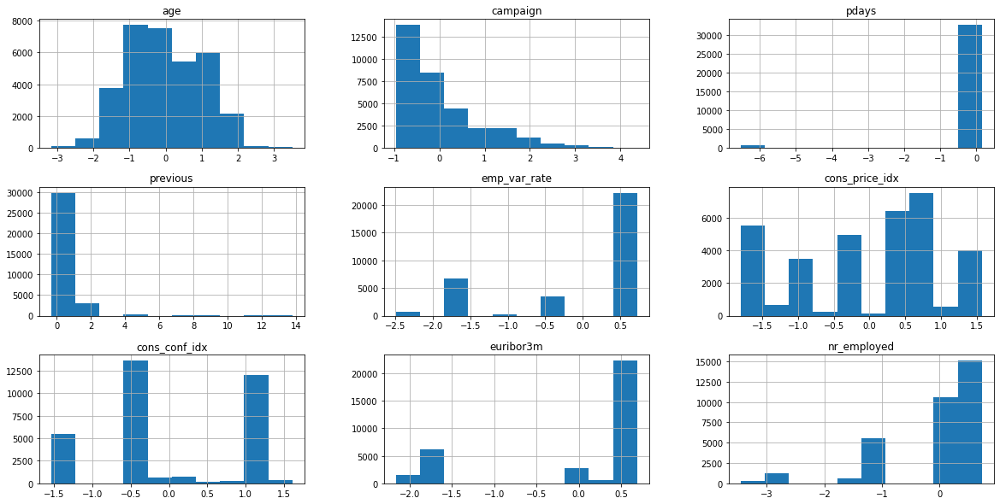

In [419]:
df.hist(alpha=1,figsize=(20, 10))

In [420]:
merge = pd.concat([df, df2], axis=1)

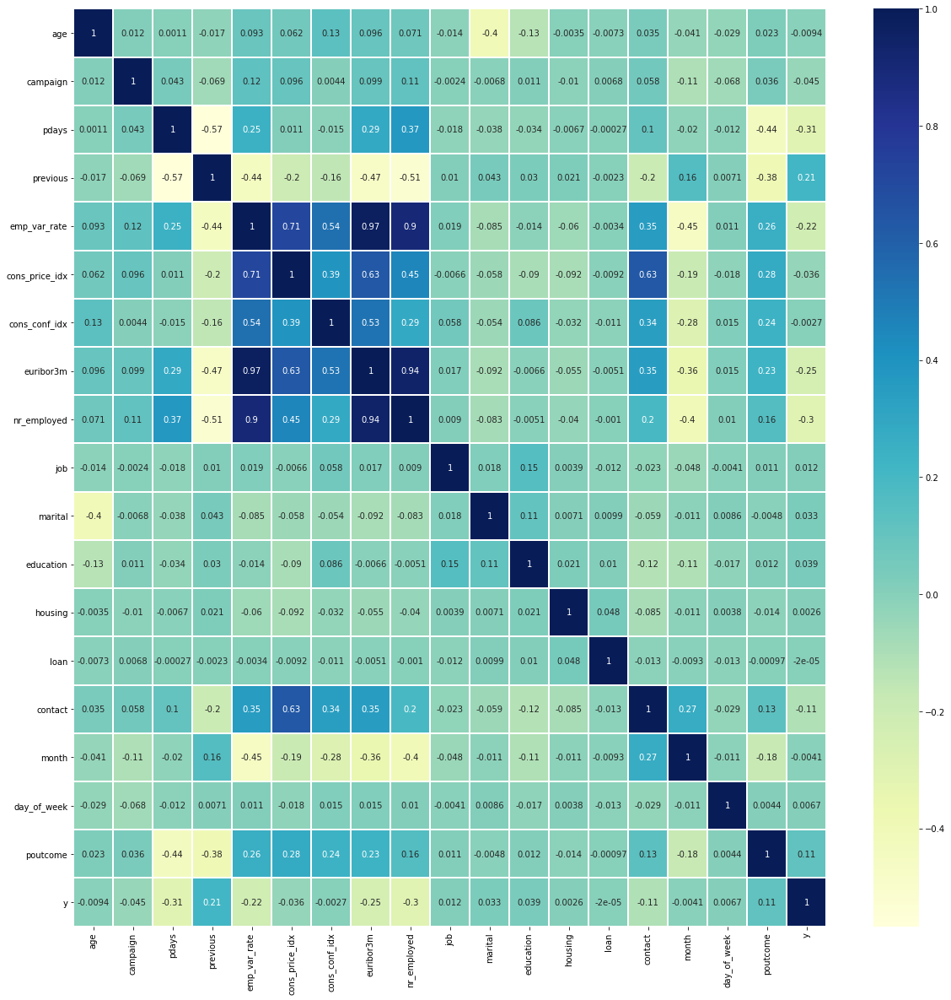

In [421]:
fig, ax = plt.subplots(figsize=(20,20)) 
sns.heatmap(merge.corr(), linewidths=.2,cmap="YlGnBu",annot=True);

____________________________________________________________
🔹 Removing high correlation value variables 👏
_________________________________________________________

In [422]:
merge.drop(['emp_var_rate'],axis=1,inplace=True)

In [423]:
merge.drop(['euribor3m'],axis=1,inplace=True)

In [424]:
merge.y.value_counts()

0    30604
1     2807
Name: y, dtype: int64

____________________________________
🔴 Handling imbalance with SMOTE 🔴
_____________________________________

In [425]:
from imblearn.over_sampling import SMOTE
smote = SMOTE()
X = merge.drop('y',axis='columns')
y = pd.DataFrame({'y': merge.y})
X_sam, y_sam = smote.fit_resample(X,y)
merge = pd.concat([X_sam, y_sam.set_index(X_sam.index)], axis = 1)


________________________________________
🔴 Under sampling 🔴
________________________________________

In [426]:
# df_class_00 =merge[merge['y'] == 0]
# df_class_11 =merge[merge['y'] == 1]
# df_class_00_under =  df_class_00.sample(df_class_11.shape[0])
# merge = pd.concat([df_class_00_under,df_class_11],axis=0)

_______________________________
🔴 Over sampling 🔴
__________________________

In [427]:
# df_class_00 =merge[merge['y'] == 0]
# df_class_11 =merge[merge['y'] == 1]
# df_class_11_over =  df_class_11.sample(df_class_00.shape[0],replace=True)
# merge = pd.concat([df_class_00,df_class_11_over],axis=0)

In [428]:
merge.y.value_counts()

0    30604
1    30604
Name: y, dtype: int64

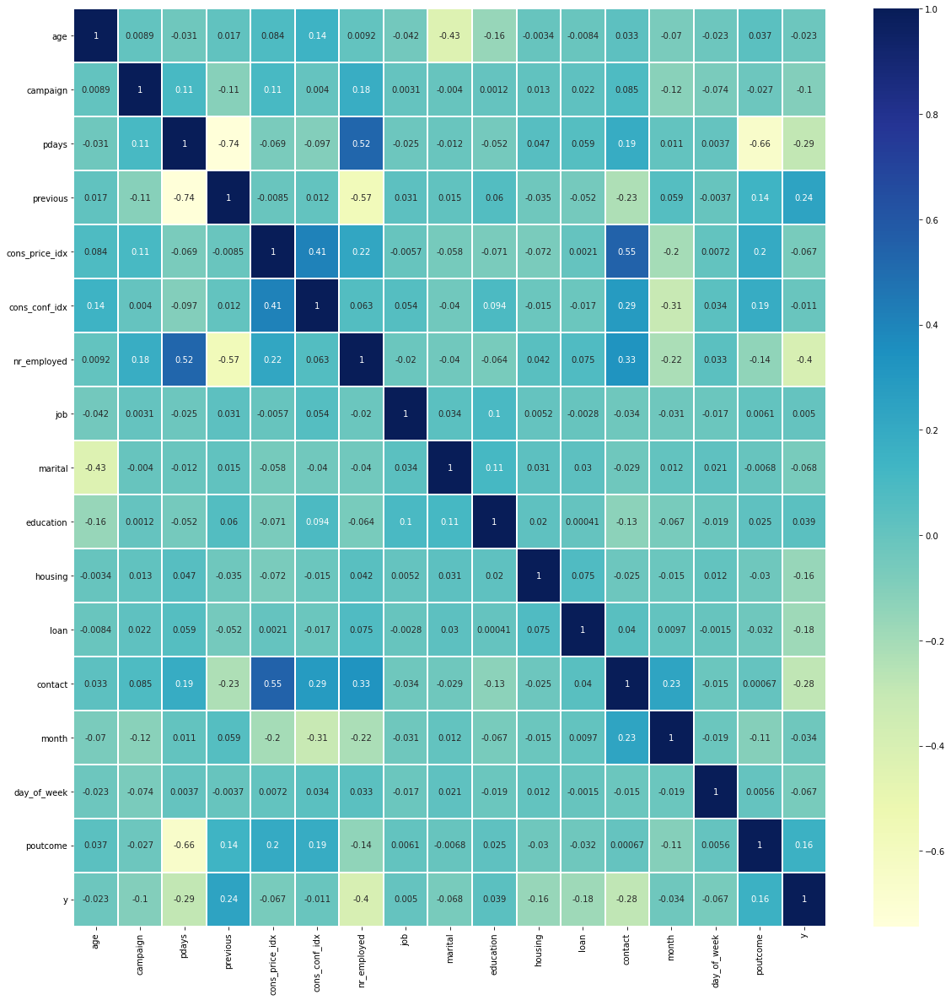

In [429]:

fig, ax = plt.subplots(figsize=(20,20)) 
sns.heatmap(merge.corr(), linewidths=.2,cmap="YlGnBu",annot=True);

🌟 Feature Scaling 🌟
--------------------------

In [430]:
pca =PCA()
X_pca = pca.fit_transform(merge)

In [431]:
final_cols = list(merge.columns.values)
dfinal = pd.DataFrame(data=X_pca, columns=final_cols)

In [432]:
dfinal.shape

(61208, 17)

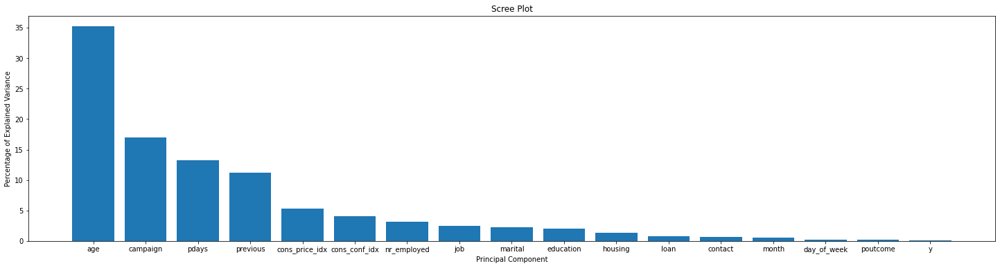

In [433]:
per_var = np.round(pca.explained_variance_ratio_* 100, decimals=1)
labels = final_cols
plt.rcParams["figure.figsize"] = (25,6)
plt.bar(x=range(1,len(per_var)+1), height=per_var, tick_label=labels)
plt.ylabel('Percentage of Explained Variance')
plt.xlabel('Principal Component')
plt.title('Scree Plot')
plt.show()

In [434]:
pca.explained_variance_ratio_

array([0.3521212 , 0.17037072, 0.13271815, 0.11244561, 0.05291359,
       0.0413099 , 0.0317913 , 0.02497886, 0.02174755, 0.01991097,
       0.0141138 , 0.00802107, 0.00686119, 0.0049082 , 0.00239231,
       0.00222173, 0.00117386])

______________________________________________________________
🌟 increasing "n_components" increased model accurecy
_____________________________________________________________

In [435]:
pca =PCA(n_components=12)
X_pca = pca.fit_transform(merge)

In [436]:
y = merge[['y']].values

In [437]:
finale_cols = [
'age',
 'campaign',
 'pdays',
 'previous',
 'cons_price_idx','nr_employed','job','marital','education','housing','loan','contact']
last = pd.DataFrame(data=X_pca, columns=finale_cols)

In [438]:
last.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61208 entries, 0 to 61207
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             61208 non-null  float64
 1   campaign        61208 non-null  float64
 2   pdays           61208 non-null  float64
 3   previous        61208 non-null  float64
 4   cons_price_idx  61208 non-null  float64
 5   nr_employed     61208 non-null  float64
 6   job             61208 non-null  float64
 7   marital         61208 non-null  float64
 8   education       61208 non-null  float64
 9   housing         61208 non-null  float64
 10  loan            61208 non-null  float64
 11  contact         61208 non-null  float64
dtypes: float64(12)
memory usage: 5.6 MB


In [439]:
from sklearn.model_selection import train_test_split

In [440]:
last.shape

(61208, 12)

In [441]:
from sklearn import svm, datasets

In [442]:
df_feat=last
df_target = merge[['y']]

In [443]:
df_target.value_counts()

y
0    30604
1    30604
dtype: int64

In [444]:
X_train, X_test, y_train, y_test = train_test_split(df_feat, np.ravel(df_target), test_size=0.2, random_state=101,stratify=y)

In [445]:
from sklearn.svm import SVC

In [446]:
model = SVC()

In [447]:
model.fit(X_train,y_train)

SVC()

In [448]:
predictions = model.predict(X_test)

In [449]:
from sklearn.metrics import classification_report,confusion_matrix

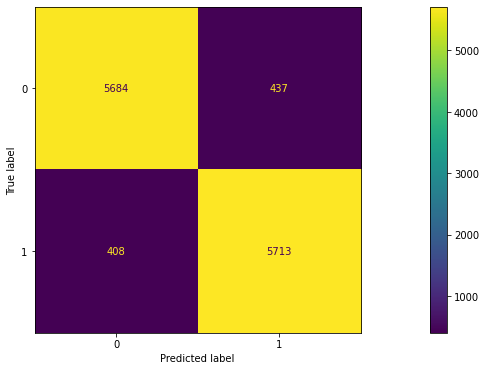

In [450]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(model, X_test, y_test)  
plt.show() 

In [451]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.93      0.93      0.93      6121
           1       0.93      0.93      0.93      6121

    accuracy                           0.93     12242
   macro avg       0.93      0.93      0.93     12242
weighted avg       0.93      0.93      0.93     12242



In [452]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, predictions)

0.930975330828296

In [453]:
from sklearn.metrics import precision_score
precision_score(y_test, predictions)

0.9289430894308943